# "Music Genre Prediction with CatBoost Classifier"
> "Applying machine learning models to music sound data to predict genre"
- toc: false
- branch: master
- badges: false
- comments: false
- image: images/music1.png
- hide: false
- search_exclude: true
- sticky_rank: 2

In [3]:
import numpy as np 
import pandas as pd 
import bokeh
from autoviz.AutoViz_Class import AutoViz_Class
import matplotlib.pyplot as plt
%matplotlib inline
import klib
import warnings
warnings.filterwarnings('ignore')
warnings.simplefilter(action='ignore', category=FutureWarning)

In [4]:
music = pd.read_csv("features_30_sec.csv")
music.head()

,filename,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,...,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,blues.00000.wav,661794,0.350088,0.088757,0.130228,0.002827,1784.165850,129774.064525,2002.449060,85882.761315,...,52.420910,-1.690215,36.524071,-0.408979,41.597103,-2.303523,55.062923,1.221291,46.936035,blues
1,blues.00001.wav,661794,0.340914,0.094980,0.095948,0.002373,1530.176679,375850.073649,2039.036516,213843.755497,...,55.356403,-0.731125,60.314529,0.295073,48.120598,-0.283518,51.106190,0.531217,45.786282,blues
2,blues.00002.wav,661794,0.363637,0.085275,0.175570,0.002746,1552.811865,156467.643368,1747.702312,76254.192257,...,40.598766,-7.729093,47.639427,-1.816407,52.382141,-3.439720,46.639660,-2.231258,30.573025,blues
3,blues.00003.wav,661794,0.404785,0.093999,0.141093,0.006346,1070.106615,184355.942417,1596.412872,166441.494769,...,44.427753,-3.319597,50.206673,0.636965,37.319130,-0.619121,37.259739,-3.407448,31.949339,blues
4,blues.00004.wav,661794,0.308526,0.087841,0.091529,0.002303,1835.004266,343399.939274,1748.172116,88445.209036,...,86.099236,-5.454034,75.269707,-0.916874,53.613918,-4.404827,62.910812,-11.703234,55.195160,blues


In [5]:
music.drop(columns=["filename"], inplace=True)
music.shape

(1000, 59)

<IPython.core.display.Javascript object>

Text(0.5, 1.0, 'Music DataFrame Null Values')

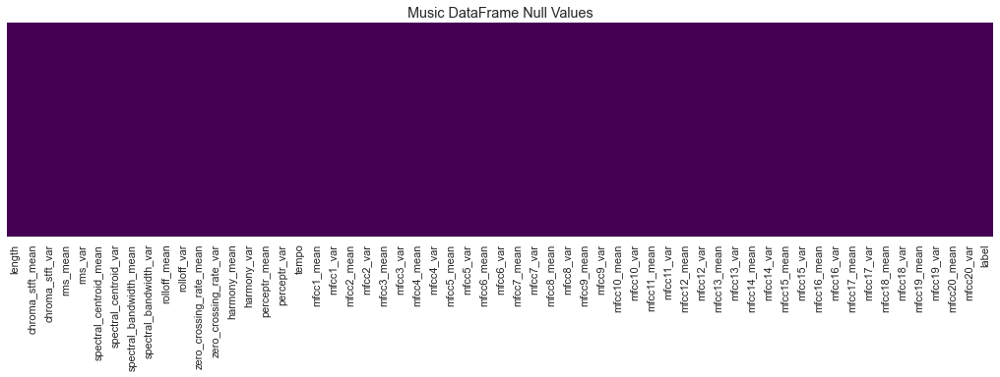

In [6]:
plt.figure(figsize=(16,4))
sns.heatmap(music.isnull(), yticklabels=False, cbar=False, cmap="viridis")
plt.title("Music DataFrame Null Values")

In [7]:
music["label"].value_counts()

blues        100
classical    100
country      100
disco        100
hiphop       100
jazz         100
metal        100
pop          100
reggae       100
rock         100
Name: label, dtype: int64

Shape of your Data Set loaded: (1000, 60)
############## C L A S S I F Y I N G  V A R I A B L E S  ####################
Classifying variables in data set...
    59 Predictors classified...
        1 variables removed since they were ID or low-information variables

################ Multi_Classification VISUALIZATION Started #####################


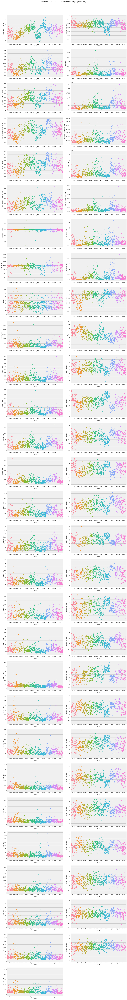

Total Number of Scatter Plots = 1653


ValueError: Image size of 1080x229824 pixels is too large. It must be less than 2^16 in each direction.

<Figure size 1080x229824 with 1596 Axes>

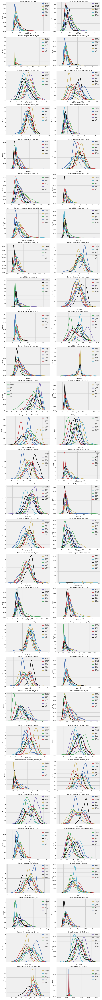

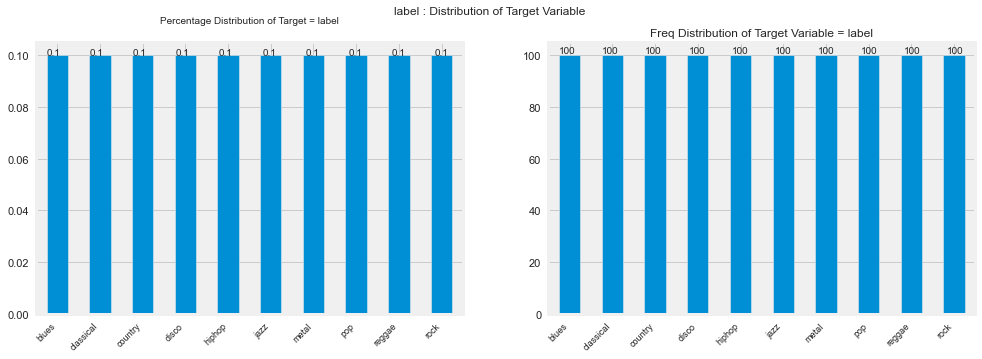

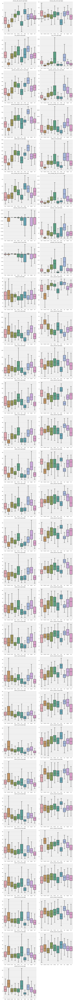

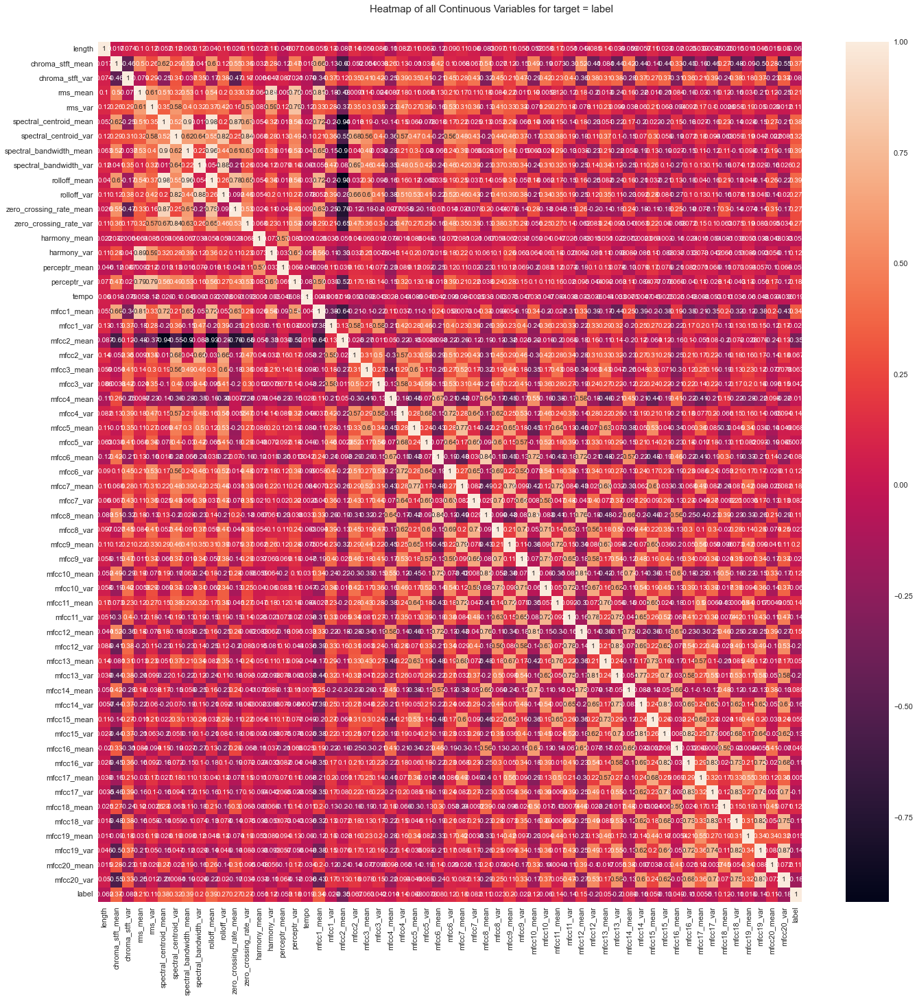

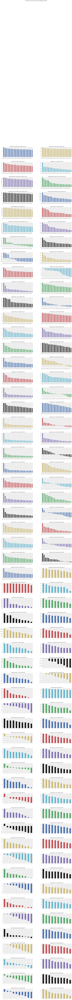

Time to run AutoViz = 813 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [8]:
#collapse_output
AV = AutoViz_Class()
target = "label"
sep=","
filename = "features_30_sec.csv"
dft = AV.AutoViz(filename, sep, target, "",
           header=0, verbose=0,
            lowess=False,chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=100)

In [6]:
#collapse_output
from pycaret.classification import *
clf = setup(music, target = 'label')

,Description,Value
0,session_id,8693
1,Target,label
2,Target Type,Multiclass
3,Label Encoded,"blues: 0, classical: 1, country: 2, disco: 3, hiphop: 4, jazz: 5, metal: 6, pop: 7, reggae: 8, rock: 9"
4,Original Data,"(1000, 59)"
5,Missing Values,0
6,Numeric Features,58
7,Categorical Features,0
8,Ordinal Features,0
9,High Cardinality Features,0


In [9]:
compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
catboost,CatBoost Classifier,0.8241,0.9811,0.8239,0.8444,0.8240,0.8045,0.8070,27.2530
rf,Random Forest Classifier,0.7841,0.9701,0.7837,0.8034,0.7810,0.7600,0.7626,0.1220
lightgbm,Light Gradient Boosting Machine,0.7841,0.9697,0.7839,0.7972,0.7814,0.7599,0.7620,2.9260
gbc,Gradient Boosting Classifier,0.7683,0.9674,0.7676,0.7908,0.7659,0.7423,0.7451,2.3450
xgboost,Extreme Gradient Boosting,0.7641,0.9650,0.7631,0.7760,0.7593,0.7376,0.7398,0.9830
et,Extra Trees Classifier,0.7568,0.9631,0.7540,0.7733,0.7512,0.7296,0.7325,0.0900
lda,Linear Discriminant Analysis,0.6997,0.9465,0.7005,0.7205,0.6961,0.6661,0.6687,0.0140
ridge,Ridge Classifier,0.6238,0.0000,0.6232,0.6403,0.6105,0.5816,0.5863,0.0060
dt,Decision Tree Classifier,0.5765,0.7644,0.5788,0.5868,0.5661,0.5291,0.5326,0.0130
nb,Naive Bayes,0.4105,0.8445,0.4082,0.4103,0.3696,0.3439,0.3560,0.0080


In [11]:
CBoost = create_model("catboost")

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8286,0.9891,0.8286,0.8432,0.8313,0.8094,0.8106
1,0.8714,0.9897,0.8726,0.9094,0.8780,0.8571,0.8607
2,0.8429,0.9847,0.8494,0.8760,0.8422,0.8254,0.8291
3,0.6857,0.9609,0.6905,0.6993,0.6788,0.6512,0.6539
4,0.8571,0.9747,0.8560,0.8641,0.8558,0.8411,0.8423
5,0.7571,0.9721,0.7476,0.7964,0.7598,0.7299,0.7345
6,0.8286,0.9775,0.8333,0.8314,0.8226,0.8094,0.8111
7,0.9143,0.9927,0.9107,0.9210,0.9124,0.9046,0.9058
8,0.7714,0.9742,0.7679,0.8004,0.7733,0.7463,0.7490
9,0.8841,0.9956,0.8827,0.9026,0.8861,0.8711,0.8727


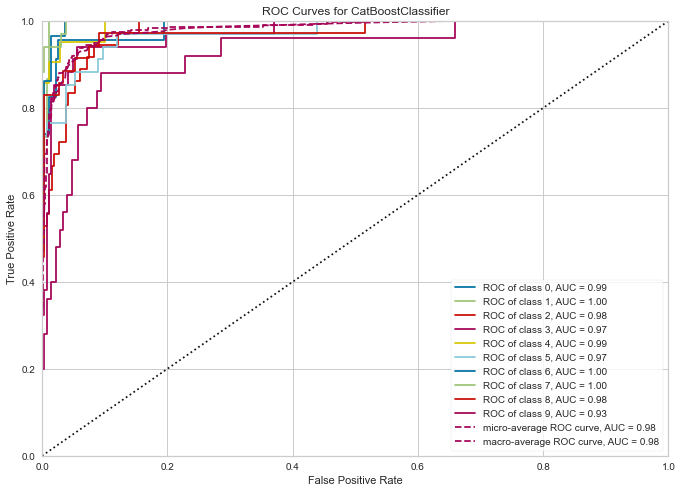

In [15]:
plt.figure(figsize=(10,8))
plot_model(CBoost, plot="auc")
#blues: 0, classical: 1, country: 2, disco: 3, hiphop: 4, jazz: 5, metal: 6, pop: 7, reggae: 8, rock: 9

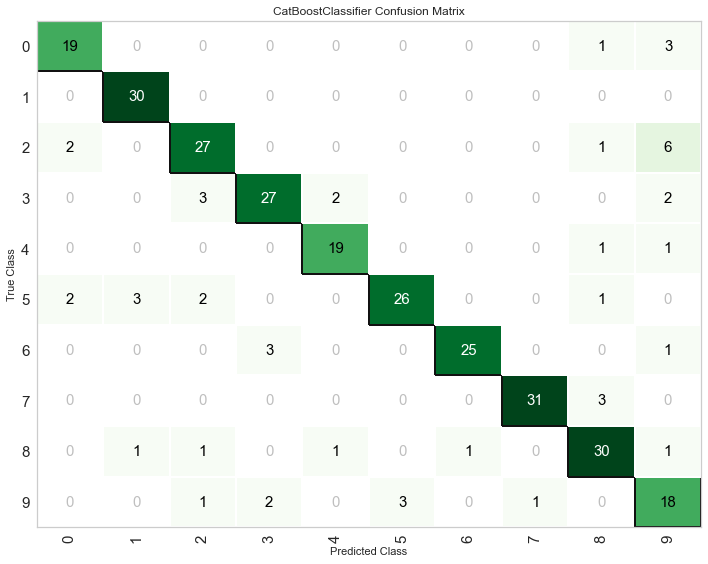

In [16]:
plt.figure(figsize=(10,8))
plot_model(CBoost, plot="confusion_matrix")
#blues: 0, classical: 1, country: 2, disco: 3, hiphop: 4, jazz: 5, metal: 6, pop: 7, reggae: 8, rock: 9

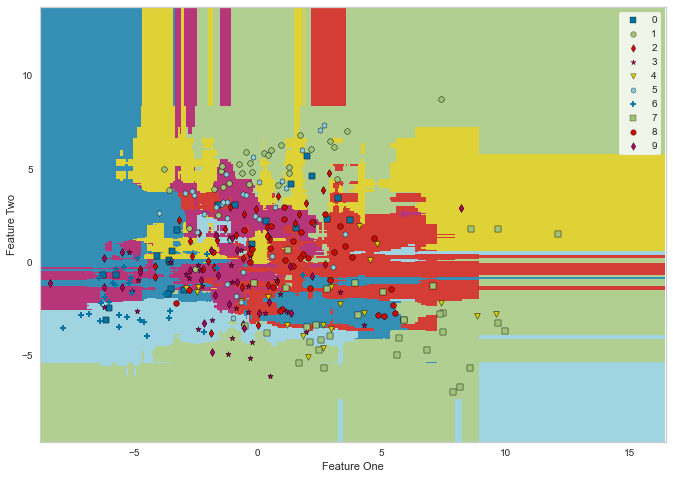

In [17]:
plt.figure(figsize=(10,8))
plot_model(CBoost, plot='boundary')

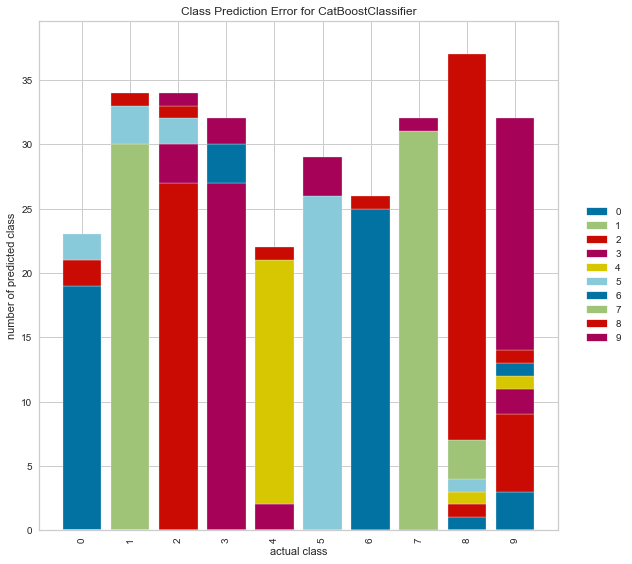

In [18]:
plt.figure(figsize=(10,8))
plot_model(CBoost, plot = 'error')

In [22]:
predictions = predict_model(CBoost)
predictions = predictions.rename(columns={"label":"Actual Label","Label":"Predicted Label"})
predictions.head()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,CatBoost Classifier,0.8372,0.9799,0.8391,0.8459,0.8392,0.8187,0.8193


,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,...,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,Actual Label,Predicted Label,Score
0,661794.0,0.293696,0.086162,0.146971,0.004145,2902.086182,335667.625000,2854.681885,153140.640625,6196.624512,...,58.243416,-2.463421,43.542133,-1.034237,77.116264,-5.114805,93.542183,jazz,jazz,0.9089
1,661794.0,0.273987,0.097541,0.069796,0.001864,1193.266235,134150.093750,1559.023682,51232.066406,2479.174561,...,35.147602,-2.239031,30.978254,-1.454300,37.516171,-5.162262,69.798859,jazz,jazz,0.9648
2,661794.0,0.490042,0.082950,0.092043,0.001892,1579.806396,522676.281250,2022.422852,258257.515625,3541.987061,...,49.908375,0.655969,50.322571,-3.783521,41.039215,-0.574324,35.579788,reggae,reggae,0.8702
3,661794.0,0.421436,0.078718,0.270942,0.001899,2442.871338,130742.023438,2358.614990,31688.839844,5267.699219,...,38.263348,3.567072,33.319927,-5.962289,34.358105,-1.646955,59.907158,blues,rock,0.5115
4,661794.0,0.396144,0.085204,0.235248,0.007127,2060.750244,229497.296875,2084.838379,81975.718750,4220.074707,...,45.364784,2.656939,55.688828,-4.384609,47.885178,0.412821,61.150539,blues,blues,0.7379


In [23]:
final_CBoost = finalize_model(CBoost)